In [22]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import os
from imutils import paths
import argparse

In [31]:
def rgb2hsv(r, g, b):
    r, g, b = r / 255.0, g / 255.0, b / 255.0

    cmax = max(r, g, b)
    cmin = min(r, g, b)
    delta = cmax - cmin

    # Calculate hue
    if delta == 0:
        h = 0
    elif cmax == r:
        h = ((g - b) / delta) % 6
    elif cmax == g:
        h = ((b - r) / delta) + 2
    else:
        h = ((r - g) / delta) + 4

    h = round(h * 60)

    # Calculate saturation
    s = 0 if cmax == 0 else round((delta / cmax) * 100)

    # Calculate value
    v = round(cmax * 100)

    return h, s, v

def showimage(pix) :
    currentimage = pix.astype(np.uint8)
    plt.imshow(currentimage)
    plt.show()

def showhistogram(pix, list) :
    value1 = [pixel[0] for sublist in pix for pixel in sublist]
    value2 = [pixel[1] for sublist in pix for pixel in sublist]
    value3 = [pixel[2] for sublist in pix for pixel in sublist]
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.hist(value1, bins=100, color='red', edgecolor='black')
    plt.title(list[0])

    plt.subplot(1, 3, 2)
    plt.hist(value2, bins=100, color='green', edgecolor='black')
    plt.title(list[1])

    plt.subplot(1, 3, 3)
    plt.hist(value3, bins=100, color='blue', edgecolor='black')
    plt.title(list[2])

    plt.show()

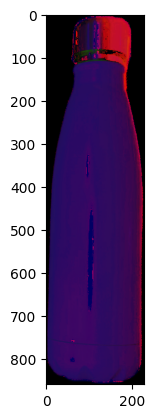

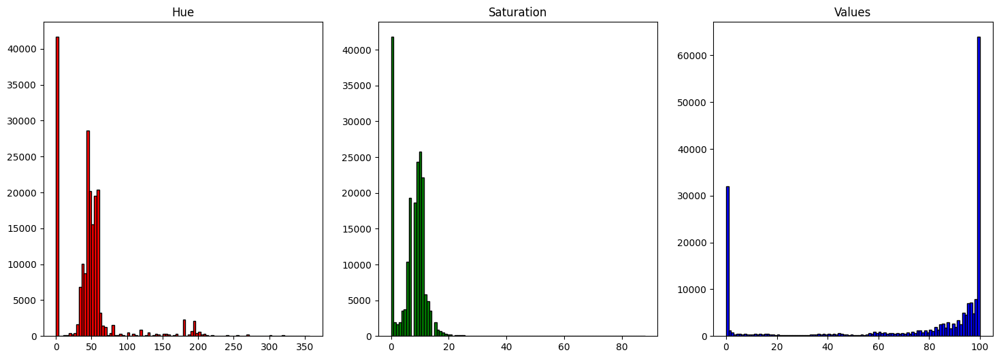

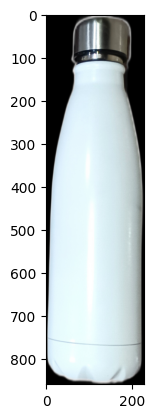

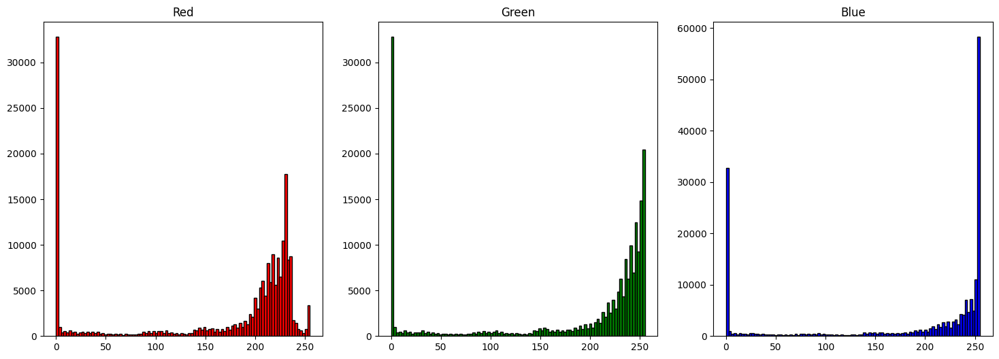

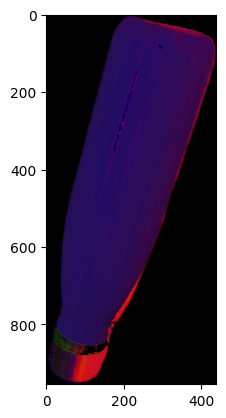

...

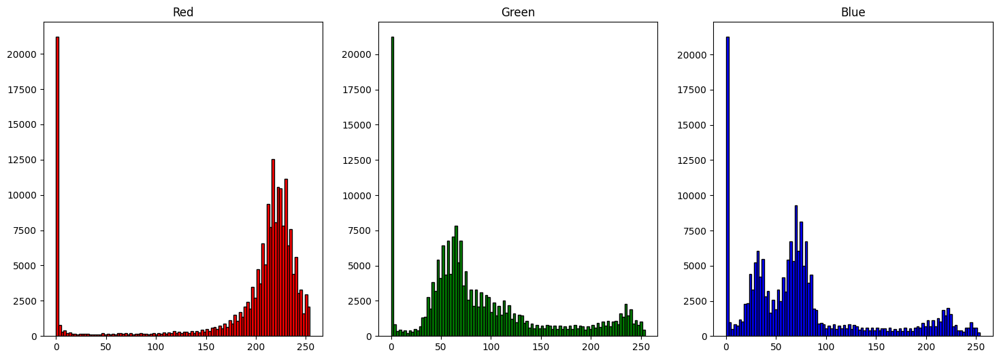

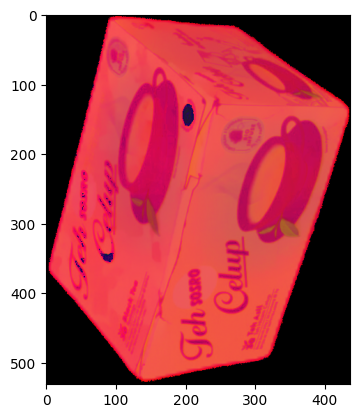

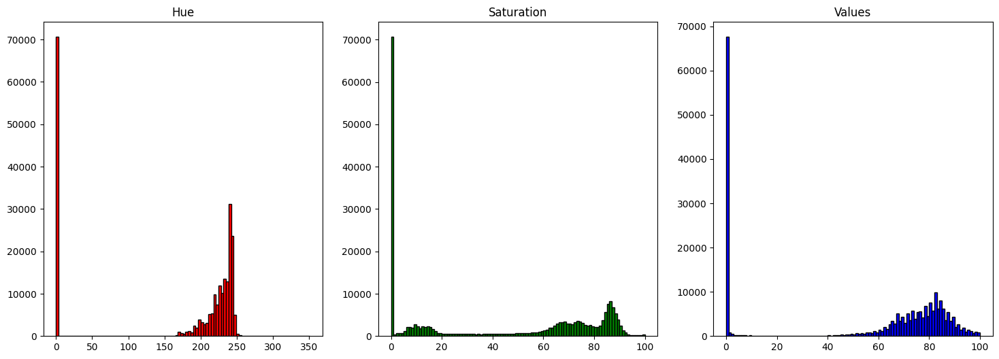

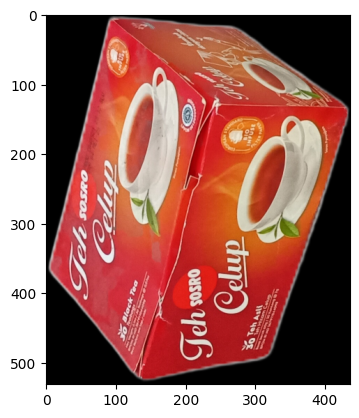

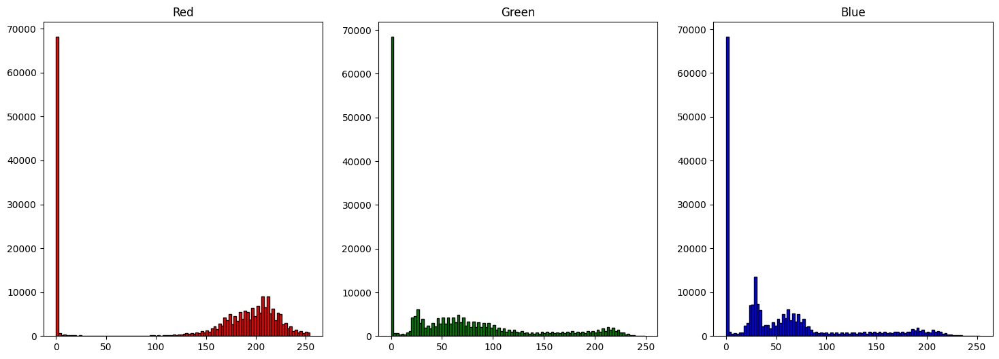

In [32]:
def read_images_from_folders(root_folder, exclude_folders=None):
    images = []
    valid_image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp']

    if exclude_folders is None:
        exclude_folders = set()

    for folder_name in os.listdir(root_folder):
        if folder_name not in exclude_folders and os.path.isdir(os.path.join(root_folder, folder_name)):
            folder_path = os.path.join(root_folder, folder_name)
            
            for filename in os.listdir(folder_path):
                if any(filename.lower().endswith(ext) for ext in valid_image_extensions):
                    image_path = os.path.join(folder_path, filename)
                    img = cv2.imread(image_path)
                    # Calculate the new dimensions based on the percentage scale
                    scale_percent = 50
                    width = int(img.shape[1] * scale_percent / 100)
                    height = int(img.shape[0] * scale_percent / 100)
                    new_dimensions = (width, height)

                    # Resize the image
                    img = cv2.resize(img, new_dimensions, interpolation=cv2.INTER_AREA)
                    

                    if img is not None:
                        images.append((folder_name, filename, img))

    return images

# Example usage:
parent_folder = r"C:\Users\raiva\OneDrive - Institut Teknologi Sepuluh Nopember\file laptop\D\VIVAT\ITS\7th Semester\DSEC\FP\image_recognition\Dataset\Train"  # Use r"..." for raw string on Windows
exclude ={'tolak_angin'}

try:
    file_list = read_images_from_folders(parent_folder, exclude)

    # Now file_list contains a list of paths to all files in every subfolder.
    # You can iterate through the list and perform further processing on each file.
    for foldername, filename, img in file_list:
        x,y,z = img.shape
        hsv_color = np.zeros((x, y, z), dtype=np.float32)
        rgb_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        for i in range(x):
            for j in range(y):
                hsv_color[i, j] = rgb2hsv(*img[i, j])

            #show hsv picture

        showimage(hsv_color)
        showhistogram(hsv_color,["Hue", "Saturation", "Values"])


        showimage(rgb_color)
        showhistogram(rgb_color,["Red", "Green", "Blue"])

except Exception as e:
    print(f"An error occurred: {e}")

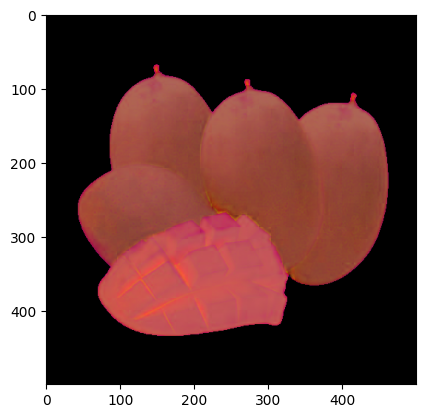

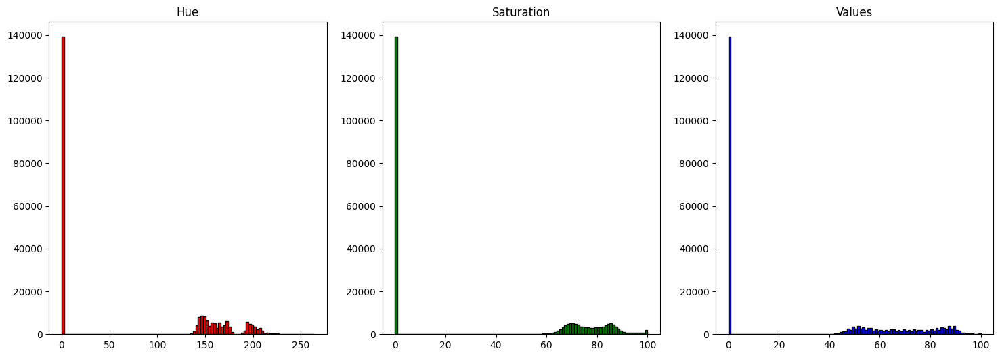

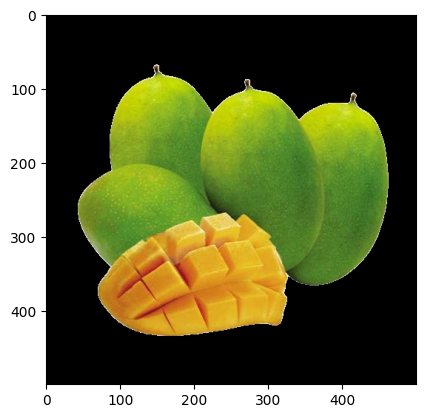

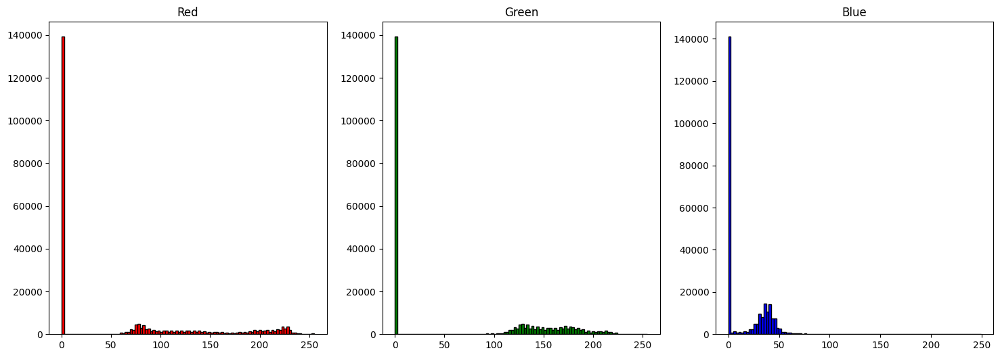

In [33]:
data = cv2.imread('Untitled-removebg-preview.png')
x,y,z = data.shape
hsv_color = np.zeros((x, y, z), dtype=np.float32)
rgb_color = cv2.cvtColor(data, cv2.COLOR_BGR2RGB)

for i in range(x):
    for j in range(y):
        hsv_color[i, j] = rgb2hsv(*data[i, j])

#show hsv picture

showimage(hsv_color)
showhistogram(hsv_color,["Hue", "Saturation", "Values"])


showimage(rgb_color)
showhistogram(rgb_color,["Red", "Green", "Blue"])